In [ ]:
import warnings
warnings.simplefilter('ignore')

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# переведемо графіки в svg
%config InlineBackend.figure_format = 'svg'

# збільшимо дефолтний розмір графіків
from pylab import rcParams
rcParams['figure.figsize'] = 8,5
import pandas as pd

In [ ]:
df = pd.read_csv("https://gist.githubusercontent.com/starquell/f5dffe3b9d410773c7dc04f2d586c090/raw/c3a765b6d0288aeca50cfc82b93214f3570f80a0/video_games_sales.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [ ]:
df['User_Score'] = df.User_Score.astype('float64', errors='ignore')
df['Year_of_Release'] = df.Year_of_Release.astype('int64', errors='ignore')
df['User_Count'] = df.User_Count.astype('int64', errors='ignore')
df['Critic_Count'] = df.Critic_Count.astype('int64', errors='ignore')

In [ ]:
df = df.dropna()
print(df.shape)

(6825, 16)


In [ ]:
useful_cols = ['Name', 'Platform', 'Year_of_Release', 'Genre', 'Global_Sales',
               'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count', 'Rating']
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006.0,Sports,82.53,76.0,51.0,8,322.0,E
2,Mario Kart Wii,Wii,2008.0,Racing,35.52,82.0,73.0,8.3,709.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,32.77,80.0,73.0,8,192.0,E
6,New Super Mario Bros.,DS,2006.0,Platform,29.80,89.0,65.0,8.5,431.0,E
7,Wii Play,Wii,2006.0,Misc,28.92,58.0,41.0,6.6,129.0,E


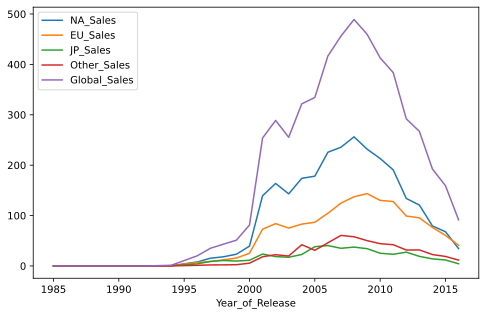

In [ ]:
sales_df = df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']]
sales_df.groupby('Year_of_Release').sum().plot()

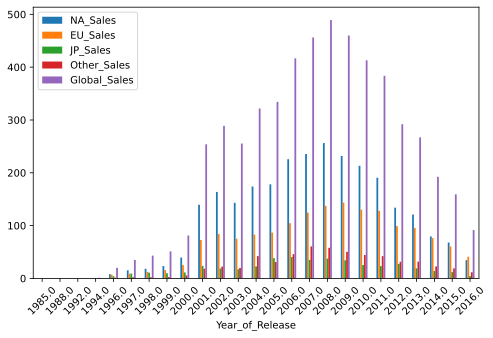

In [ ]:
sales_df.groupby('Year_of_Release').sum().plot(kind='bar', rot=45)

In [ ]:
cols = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Count', 'User_Score']
sns_plot = sns.pairplot(df[cols])
sns_plot.savefig('pairplot.png')

In [ ]:
from google.colab import files

files.upload()

df = pd.read_csv('iris.csv')
df.info()

Saving iris.csv to iris.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   species       150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


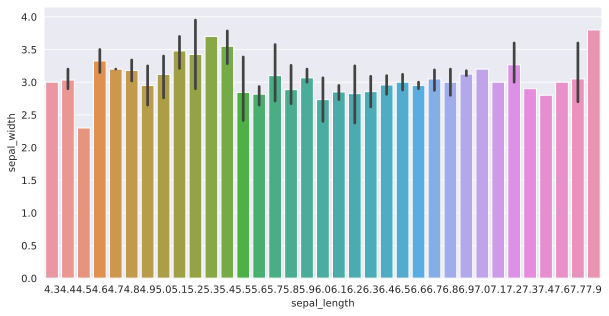

In [ ]:
plt.figure(figsize=(10,5))
sns.set_style('darkgrid')
sns.barplot(x='sepal_length', y='sepal_width', data=df)

In [ ]:
df = sns.load_dataset('tips')
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [ ]:
df['tip_percentage'] = df['tip'] / df['total_bill']
df.head()

,total_bill,tip,sex,smoker,day,time,size,tip_percentage
0,16.99,1.01,Female,No,Sun,Dinner,2,0.059447
1,10.34,1.66,Male,No,Sun,Dinner,3,0.160542
2,21.01,3.50,Male,No,Sun,Dinner,3,0.166587
3,23.68,3.31,Male,No,Sun,Dinner,2,0.139780
4,24.59,3.61,Female,No,Sun,Dinner,4,0.146808


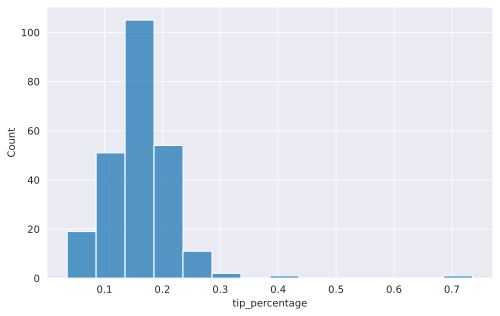

In [ ]:
sns.histplot(df['tip_percentage'], binwidth=0.05)

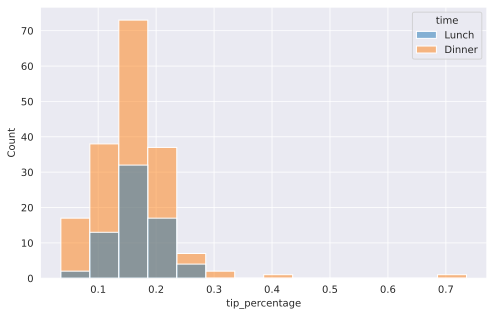

In [ ]:
sns.histplot(data=df, x='tip_percentage', binwidth=0.05, hue='time')

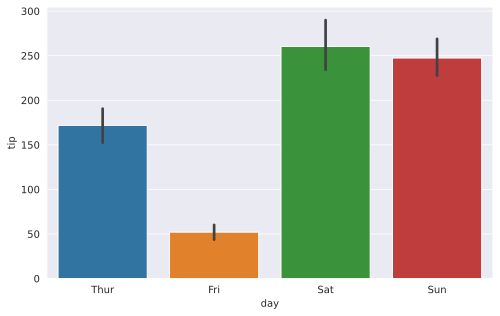

In [ ]:
sns.barplot(data=df, x='day', y='tip', estimator=np.sum)

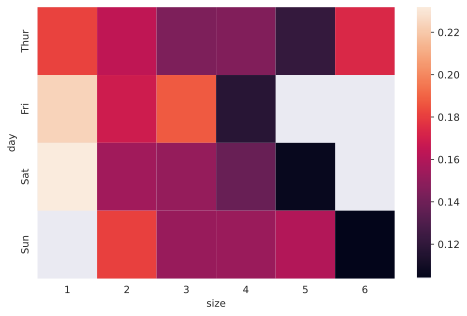

In [ ]:
pivot = df.pivot_table(
    index=['day'],
    columns=['size'],
    values='tip_percentage',
    aggfunc = np.average
)
sns.heatmap(pivot)